# Simulate dataset

In [1]:
%reload_ext autoreload
%autoreload 2
import os, sys
sys.path.append('/insomnia001/home/hy2897/projects/pointcloud')
from simulation import *

In [2]:
!nvidia-smi

Fri May  8 08:45:46 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 575.57.08              Driver Version: 575.57.08      CUDA Version: 12.9     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA RTX A6000               On  |   00000000:41:00.0 Off |                  Off |
| 30%   30C    P8             22W /  300W |       1MiB /  49140MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
sphere = sample_sphere_point_cloud(n=3000, radius=1.0, noise=0.01, random_state=1)
plot_point_cloud(sphere, title="Sphere-like nucleus")

In [4]:
ellipsoid = sample_ellipsoid_point_cloud(n=3000, axes=(1, 0.6, 0.6), noise=0.01, random_state=2)
plot_point_cloud(ellipsoid, title="Ellipsoid-like nucleus")

In [5]:
plot_point_cloud(add_side_indentation(ellipsoid, indent_center=(0.0, 0.5, 0.0), sigma=1, depth=0.4), title="Ellipsoid with side indentation")

In [6]:
ellipsoid = sample_ellipsoid_point_cloud(n=2000, axes=(0.9, 0.5, 0.5), noise=0.01, random_state=2)
plot_point_cloud(add_ring_indentation(ellipsoid, axis=(1, 0.0, 0.0), z0=0.1, sigma_z=0.25, depth=0.3, offset=(0.0, 0.35, 0.0)),title="Ellipsoid with ring indentation")

In [7]:
egg = sample_egg_shape_point_cloud(
    n=2000,
    axes=(1, 0.8, 0.8),
    axis=(1.0, 0.0, 0.0),
    eggness=0.15,
    noise=0.01,
    random_state=2,
)
plot_point_cloud(egg, title="Egg-shaped nucleus")


In [8]:
plot_point_cloud(add_ring_indentation(egg, axis=(1, 0.0, 0.0), z0=0.2, sigma_z=0.3, depth=0.4, offset=(0.0, 0.3, 0.0)),title='Deformed egg-shaped nucleus with ring indentation')

In [12]:
plot_point_cloud(add_side_indentation(egg),title='Deformed egg-shaped nucleus with side indentation')

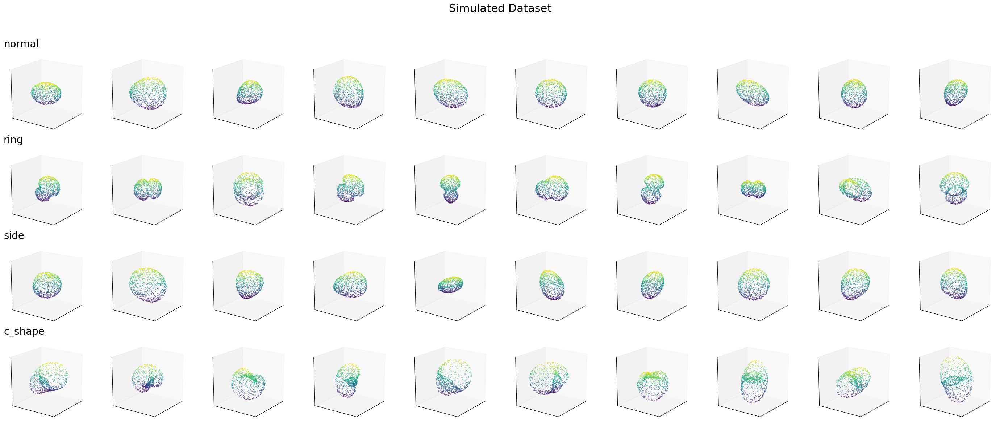

In [9]:
import numpy as np

dataset = build_simulated_nucleus_dataset(
    n_normal=200,
    n_ring=200,
    n_side=200,
    n_c_shape=200,
    points_per_nucleus=1024,
    random_orientation=True,
    base_kwargs={
        "aspect_ratio_2_range": (0.70, 0.98),
        "aspect_ratio_3_range": (0.55, 0.92),
        "eggness_range": (0.0, 0.30),
    },
    ring_kwargs={
        "depth_range": (0.3, 0.5),
        "z0_range": (-0.3, 0.3),
    },
    side_kwargs={
        "depth_range": (0.30, 0.50),
    },
    c_shape_kwargs={
        "bend_angle_range": (1.15 * np.pi, 1.75 * np.pi),
        "arc_length_scale_range": (1.00, 1.18),
    },
    random_state=42,
)

plot_simulated_dataset_gallery(
    dataset,
    samples_per_subtype=10,
    subtypes=("normal", "ring", "side", "c_shape"),
    figsize=(28, 12),
    point_size=2.0,
    title = 'Simulated Dataset'
)


In [10]:
dataset

{'points': array([[[-0.57796457, -1.12805092,  0.23239739],
         [ 0.30676898,  0.83394702,  0.76125568],
         [-0.57805703,  0.189785  ,  0.93941859],
         ...,
         [ 1.16227549, -0.18519157, -0.35128331],
         [ 0.33473735, -0.54219962,  0.15769456],
         [-0.201504  ,  0.92319417, -0.49706645]],
 
        [[-0.90583768,  0.28434848,  0.05063207],
         [ 0.34761453, -0.242981  ,  0.7385603 ],
         [ 0.00743351, -0.19655905,  0.89613046],
         ...,
         [-0.49262778,  0.82486813, -0.0945505 ],
         [ 0.78237157, -0.28502284,  0.24237131],
         [-0.40557708,  0.62052147,  0.71010753]],
 
        [[ 0.58670672, -0.13763296, -0.125982  ],
         [ 0.18603876,  0.42761969,  0.64731655],
         [ 0.61556406,  0.37856555,  0.29977793],
         ...,
         [-0.76153894, -0.34464251,  0.00172951],
         [ 0.56776907,  0.37396777,  0.45865453],
         [-0.13430479,  0.47334479,  0.52532089]],
 
        ...,
 
        [[-0.63419831,  

## C-shape nucleus simulation

In [11]:
%autoreload 2
import numpy as np

c_shape, c_shape_meta = sample_c_shape_nucleus_point_cloud(
    n=3000,
    random_orientation=False,
    base_kwargs={
        "size_range": (1.05, 1.20),
        "aspect_ratio_2_range": (0.30, 0.38),
        "aspect_ratio_3_range": (0.24, 0.32),
        "eggness_range": (0.0, 0.10),
        "noise_range": (0.005, 0.012),
    },
    bend_angle_range=(1.35 * np.pi, 1.55 * np.pi),
    arc_length_scale_range=(1.05, 1.12),
    random_state=7,
)

plot_point_cloud(c_shape, title="C-shaped nucleus")
c_shape_meta


{'axes': array([1.32770358, 0.48013239, 0.39332028]),
 'size': 1.157550779328028,
 'eggness': 0.01850953146074501,
 'noise': 0.008065654434277182,
 'axis': array([0.99999999, 0.        , 0.        ]),
 'basis': array([[ 0.99999999,  0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.99999999],
        [ 0.        , -0.99999999,  0.        ]]),
 'deformation': 'c_shape',
 'bend_angle': 4.728527775540027,
 'bend_angle_degrees': 270.924684848827,
 'arc_length_scale': 1.0657645032993415,
 'deformation_axis_index': 0,
 'deformation_axis': array([0.99999999, 0.        , 0.        ]),
 'bend_direction_index': 2,
 'bend_direction': array([ 0.        , -0.99999999,  0.        ])}

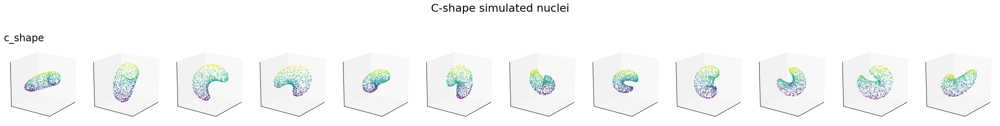

In [12]:
c_shape_dataset = build_simulated_nucleus_dataset(
    n_normal=0,
    n_ring=0,
    n_side=0,
    n_c_shape=24,
    points_per_nucleus=1024,
    random_orientation=True,
    base_kwargs={
        "size_range": (1.05, 1.25),
        "aspect_ratio_2_range": (0.28, 0.44),
        "aspect_ratio_3_range": (0.22, 0.38),
        "eggness_range": (0.0, 0.16),
        "noise_range": (0.004, 0.015),
    },
    c_shape_kwargs={
        "bend_angle_range": (1.15 * np.pi, 1.75 * np.pi),
        "arc_length_scale_range": (1.00, 1.18),
    },
    random_state=17,
)

plot_simulated_dataset_gallery(
    c_shape_dataset,
    samples_per_subtype=12,
    subtypes=("c_shape",),
    figsize=(28, 4),
    point_size=2.0,
    title="C-shape simulated nuclei",
)


# Preprocess PointCloud dataset

In [13]:
def normalize_point_cloud_size(points, eps=1e-8):
    """
    points: (n_samples, n_points, 3)
    returns:
        points_norm: size-normalized point clouds
        centers: per-nucleus centroid
        scales: per-nucleus size
    """
    points = np.asarray(points)

    centers = points.mean(axis=1, keepdims=True)
    centered = points - centers

    # RMS radius: sqrt(mean(||x_i||^2))
    scales = np.sqrt((centered ** 2).sum(axis=2).mean(axis=1, keepdims=True))
    scales = scales[:, None, :]  # (n_samples, 1, 1)

    points_norm = centered / (scales + eps)
    return points_norm, centers, scales


In [14]:
dataset_points = dataset["points"]  # (n_samples, n_points, 3)
points_norm, centers, scales = normalize_point_cloud_size(dataset_points)
dataset["points_norm"] = points_norm
dataset["centers"] = centers
dataset["scales"] = scales

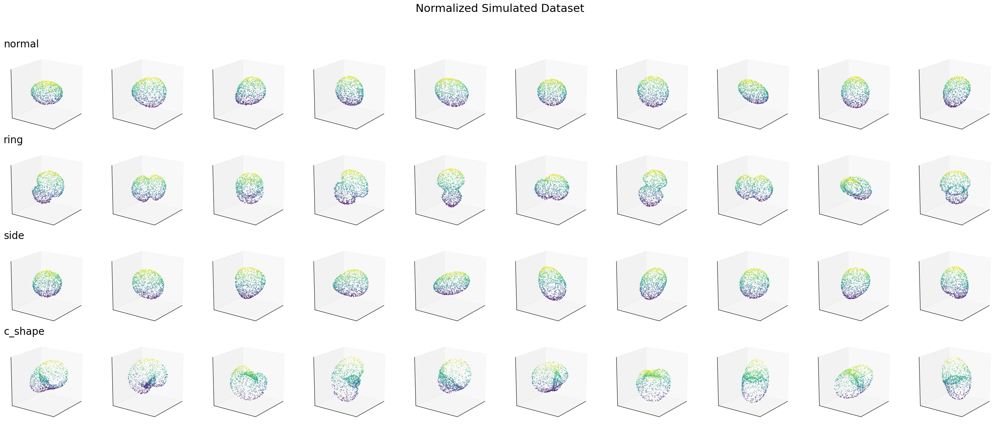

In [15]:
plot_simulated_dataset_gallery(
    dataset,
    samples_per_subtype=10,
    figsize=(28, 12),
    point_size=2.0,
    title = "Normalized Simulated Dataset",
    points_key='points_norm'
)

# PointCloudAutoEncoder

Epoch 001/010 | loss=0.247408 | chamfer=0.247408 | relative=0.000000
Epoch 002/010 | loss=0.059632 | chamfer=0.059632 | relative=0.000000
Epoch 003/010 | loss=0.058054 | chamfer=0.058054 | relative=0.000000
Epoch 004/010 | loss=0.056535 | chamfer=0.056535 | relative=0.000000
Epoch 005/010 | loss=0.056147 | chamfer=0.056147 | relative=0.000000
Epoch 006/010 | loss=0.055518 | chamfer=0.055518 | relative=0.000000
Epoch 007/010 | loss=0.052531 | chamfer=0.052531 | relative=0.000000
Epoch 008/010 | loss=0.048252 | chamfer=0.048252 | relative=0.000000
Epoch 009/010 | loss=0.046425 | chamfer=0.046425 | relative=0.000000
Epoch 010/010 | loss=0.045283 | chamfer=0.045283 | relative=0.000000


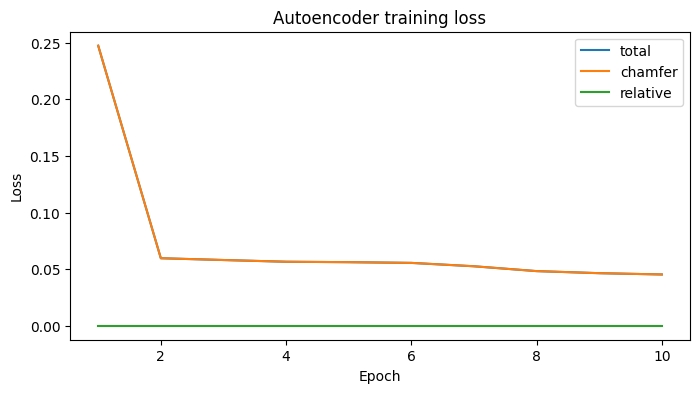

In [16]:
from autoencoder import PointCloudAutoEncoder
import matplotlib.pyplot as plt
import torch

used_dataset = dataset

points = used_dataset["points_norm"]
device = "cuda" if torch.cuda.is_available() else "cpu"

model = PointCloudAutoEncoder(
    latent_dim=256,
    num_points=points.shape[1],
).to(device)

# Chamfer loss on 2000-point clouds is memory-heavy.
# If you hit OOM on GPU, try batch_size=2.
history = model.train_model(
    points,
    epochs=10,
    batch_size=16,
    lr=1e-3,
    device=device,
    chamfer_weight=1.0,
    relative_weight=0.0,
    global_num_pairs="all",
    relative_p=2,
    relative_mode="global",
    knn_k=16,
)

plt.figure(figsize=(8, 4))
plt.plot(history["epoch"], history["loss"], label="total")
plt.plot(history["epoch"], history["chamfer"], label="chamfer")
plt.plot(history["epoch"], history["relative"], label="relative")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Autoencoder training loss")
plt.legend()
plt.show()

In [17]:
sample_idx = 3
sample_points = points[sample_idx]
recon, z = model.reconstruct(sample_points, device=device)

print("Sample input shape:", sample_points.shape)
print("Sample reconstruction shape:", recon.shape)
print("Latent shape:", z.shape)

plot_point_cloud(sample_points, title=f"Input sample {sample_idx}")
plot_point_cloud(recon, title=f"Reconstruction sample {sample_idx}")


Sample input shape: (1024, 3)
Sample reconstruction shape: (1024, 3)
Latent shape: (256,)


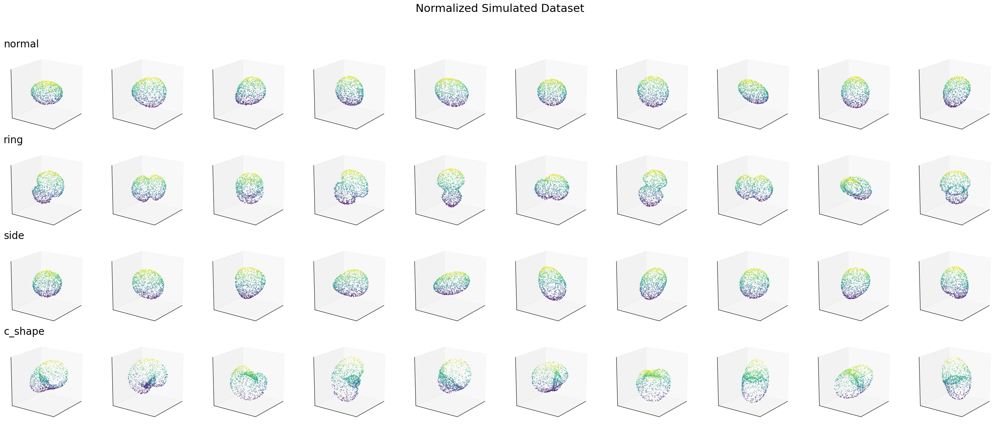

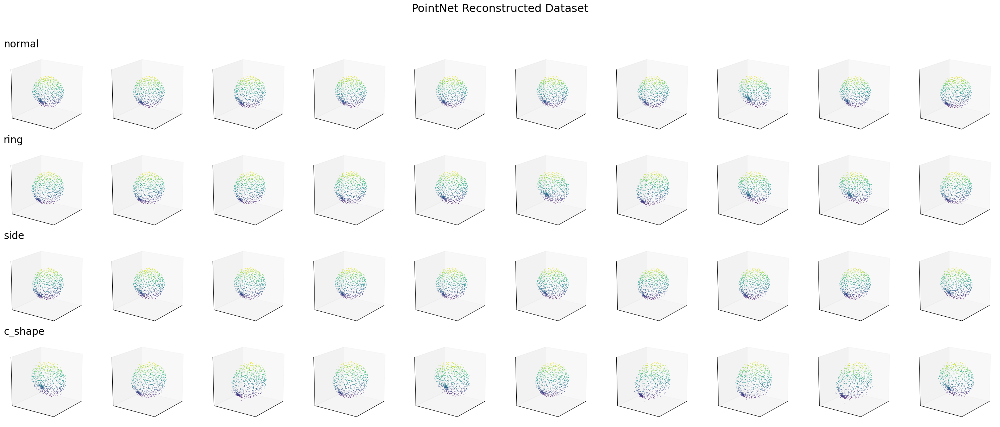

In [18]:
%autoreload 2
import simulation

#simulation = reload(simulation)

plot_simulated_dataset_gallery(
    used_dataset,
    samples_per_subtype=10,
    figsize=(28, 12),
    point_size=2.0,
    title="Normalized Simulated Dataset",
    points_key="points_norm",
)

simulation.plot_reconstructed_dataset_gallery(
    model,
    used_dataset,
    device=device,
    samples_per_subtype=10,
    figsize=(28, 12),
    point_size=2.0,
    random_state=0,
    title="PointNet Reconstructed Dataset",
    points_key="points_norm",
)


Sample input shape: (1024, 3)
Sample reconstruction shape: (1024, 3)
Latent shape: (256,)


/insomnia001/depts/pmg/users/hy2897/conda_envs/LUNA/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


latents shape: (800, 256)
UMAP embedding shape: (800, 2)


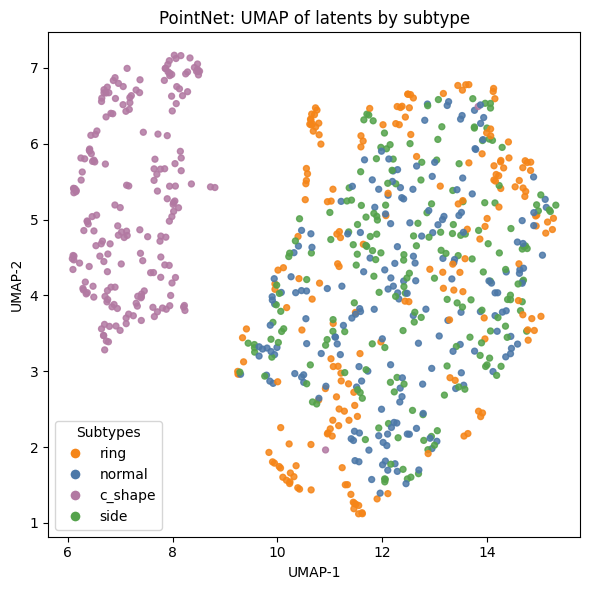

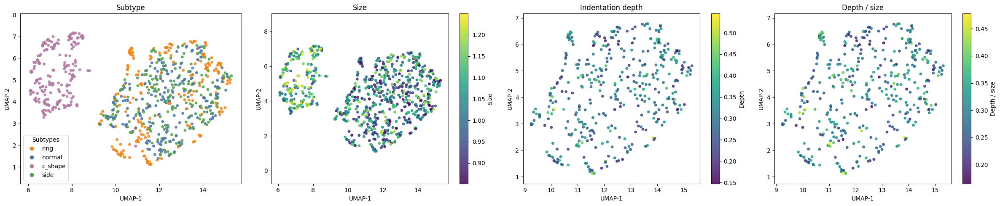

In [165]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

os.environ.setdefault("NUMBA_CACHE_DIR", "/tmp/numba_cache")
import umap.umap_ as umap

sample_idx = 1
sample_points = points[sample_idx]
recon, z = model.reconstruct(sample_points, device=device)

print("Sample input shape:", sample_points.shape)
print("Sample reconstruction shape:", recon.shape)
print("Latent shape:", z.shape)

plot_point_cloud(sample_points, title=f"Input sample {sample_idx}")
plot_point_cloud(recon, title=f"PointNet Reconstruction sample {sample_idx}")

points = used_dataset["points_norm"]
latents = model.encode(points, device=device)
labels_raw = np.asarray(used_dataset["labels"])
subtypes = np.asarray(used_dataset["subtypes"]).astype(str)

if len(latents) != len(labels_raw) or len(latents) != len(subtypes):
    raise ValueError(
        "latents, labels, and subtypes must have the same length for plotting."
    )

reducer = umap.UMAP(
    n_components=2,
    n_neighbors=min(15, len(latents) - 1),
    min_dist=0.1,
    metric="euclidean",
    random_state=42,
)
embedding = reducer.fit_transform(latents)

print("latents shape:", latents.shape)
print("UMAP embedding shape:", embedding.shape)

palette = [
    "#4C78A8", "#E45756", "#F58518", "#54A24B",
    "#B279A2", "#72B7B2", "#FF9DA6", "#9D755D",
]
subtype_names = list(dict.fromkeys(subtypes))
subtype_base_colors = {
    "normal": "#4C78A8",
    "ring": "#F58518",
    "side": "#54A24B",
    "c_shape": "#B279A2",
}
subtype_colors = {
    name: subtype_base_colors.get(name, palette[i % len(palette)])
    for i, name in enumerate(subtype_names)
}

size = np.asarray([meta.get("size", np.nan) for meta in used_dataset["metadata"]], dtype=float)
depth = np.asarray([meta.get("depth", np.nan) for meta in used_dataset["metadata"]], dtype=float)
depth_size_ratio = depth / (size + 1e-8)

fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.scatter(
    embedding[:, 0],
    embedding[:, 1],
    c=[subtype_colors[v] for v in subtypes],
    s=18,
    alpha=0.85,
)
ax.set_title("PointNet: UMAP of latents by subtype")
ax.set_xlabel("UMAP-1")
ax.set_ylabel("UMAP-2")
ax.legend(
    handles=[
        Line2D([0], [0], marker="o", color="w",
               markerfacecolor=subtype_colors[name], markersize=8, label=name)
        for name in subtype_names
    ],
    title="Subtypes",
)
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(1, 4, figsize=(24, 5))

ax[0].scatter(
    embedding[:, 0],
    embedding[:, 1],
    c=[subtype_colors[v] for v in subtypes],
    s=15,
    alpha=0.85,
)
ax[0].set_title("Subtype")
ax[0].legend(
    handles=[
        Line2D([0], [0], marker="o", color="w",
               markerfacecolor=subtype_colors[name], markersize=8, label=name)
        for name in subtype_names
    ],
    title="Subtypes",
)

sc = ax[1].scatter(
    embedding[:, 0],
    embedding[:, 1],
    c=size,
    s=15,
    alpha=0.85,
    cmap="viridis",
)
ax[1].set_title("Size")
fig.colorbar(sc, ax=ax[1], label="Size")

sc = ax[2].scatter(
    embedding[:, 0],
    embedding[:, 1],
    c=depth,
    s=15,
    alpha=0.85,
    cmap="viridis",
)
ax[2].set_title("Indentation depth")
fig.colorbar(sc, ax=ax[2], label="Depth")

sc = ax[3].scatter(
    embedding[:, 0],
    embedding[:, 1],
    c=depth_size_ratio,
    s=15,
    alpha=0.85,
    cmap="viridis",
)
ax[3].set_title("Depth / size")
fig.colorbar(sc, ax=ax[3], label="Depth / size")

for axis in ax:
    axis.set_xlabel("UMAP-1")
    axis.set_ylabel("UMAP-2")
    axis.set_aspect("equal", adjustable="datalim")

plt.tight_layout()
plt.show()


# PointMIL

In [14]:
from pointmil import NucleusPointCloudMILClassifier

In [25]:
clf = NucleusPointCloudMILClassifier(
    input_dim=3,
    num_classes=3,
    n_points=1024,
    feature_dim=256,
    pooling="conjunctive",   # "instance", "attention", "additive", "conjunctive"
    context_k=12,
    lr=1e-3,
)

val_point_clouds = dataset["points"][200:250]
val_labels = dataset["labels"][200:250]

clf.fit(
    train_point_clouds=dataset["points"][0:200],  # Use the first 200 samples for training
    train_labels=dataset["labels"][0:200],
    val_point_clouds=val_point_clouds,  # Use the next 50 samples for validation
    val_labels=val_labels,
    epochs=100,
    batch_size=16,
    verbose=True,
)


Epoch 001 | train_loss=0.9134 train_acc=0.6450 | val_loss=1.0016 val_acc=0.6800
Epoch 002 | train_loss=0.8301 train_acc=0.6950 | val_loss=0.9159 val_acc=0.6800
Epoch 003 | train_loss=0.8132 train_acc=0.6950 | val_loss=0.8299 val_acc=0.6800
Epoch 004 | train_loss=0.7994 train_acc=0.6950 | val_loss=0.8231 val_acc=0.6800
Epoch 005 | train_loss=0.7641 train_acc=0.6950 | val_loss=0.7931 val_acc=0.6800
Epoch 006 | train_loss=0.7082 train_acc=0.7050 | val_loss=0.6613 val_acc=0.7600
Epoch 007 | train_loss=0.6619 train_acc=0.7550 | val_loss=0.6059 val_acc=0.7800
Epoch 008 | train_loss=0.6104 train_acc=0.7600 | val_loss=0.5563 val_acc=0.8000
Epoch 009 | train_loss=0.6146 train_acc=0.7600 | val_loss=0.5271 val_acc=0.8400
Epoch 010 | train_loss=0.5541 train_acc=0.8100 | val_loss=0.5178 val_acc=0.8200
Epoch 011 | train_loss=0.5669 train_acc=0.7800 | val_loss=0.5101 val_acc=0.8400
Epoch 012 | train_loss=0.5337 train_acc=0.8000 | val_loss=0.4976 val_acc=0.8200
Epoch 013 | train_loss=0.5386 train_acc=

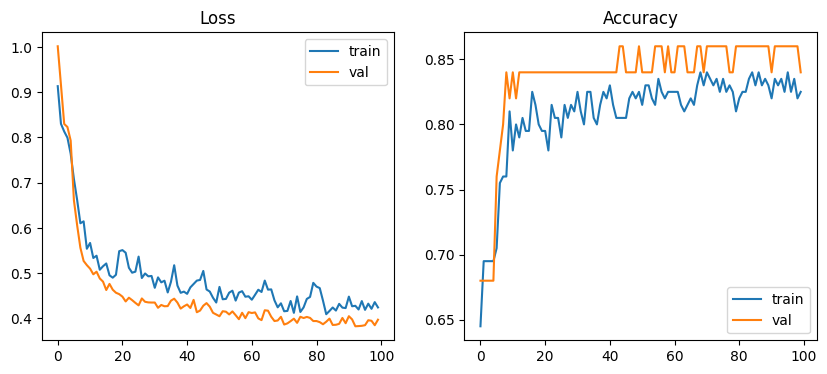

In [26]:
clf.plot_history()

In [27]:
pred_labels = clf.predict(dataset['points'][250:300])
pred_probs = clf.predict_proba(dataset['points'][250:300])

print(pred_labels)
print(pred_probs.shape)  # (10, 3)

[1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]
(50, 3)


In [28]:
gt_labels = dataset['labels'][250:300]
gt_labels

array([1, 1, 0, 2, 0, 2, 2, 0, 1, 1, 1, 2, 1, 2, 0, 2, 0, 1, 1, 0, 2, 0,
       0, 0, 0, 0, 0, 2, 0, 0, 1, 1, 0, 0, 0, 0, 2, 0, 0, 1, 0, 2, 0, 0,
       2, 0, 0, 1, 0, 0])

1 [5.4878374e-06 9.9998450e-01 1.0049419e-05]


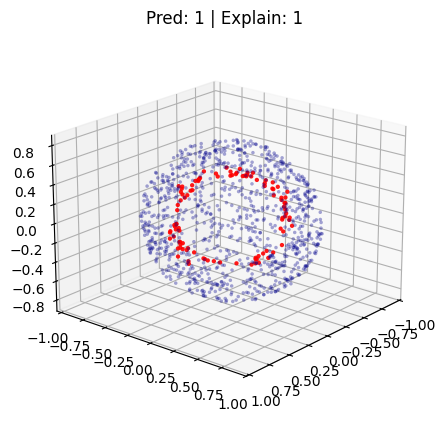

In [41]:
from simulation import plot_point_cloud

exp = clf.explain(val_point_clouds[0])
print(exp["pred_label"], exp["pred_proba"])

clf.plot_explanation(
    exp,
    highlight_q=0.9,
    other_color="darkblue",
    important_color="red",
)

# Interactive plotly view
plot_point_cloud(
    exp["points"],
    color=exp["scores"],
    title="MIL importance (interactive)",
    highlight_q=0.9,
    other_color="darkblue",
    important_color="red",
)


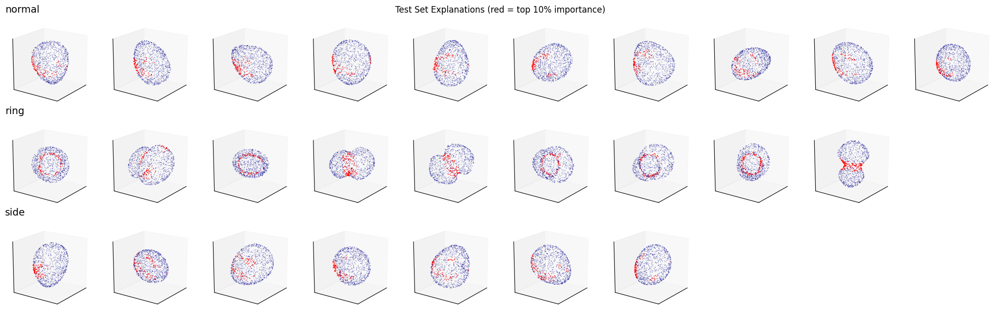

In [45]:
import math
import numpy as np
import matplotlib.pyplot as plt

# Visualize explanations for all test point clouds, split by subtype.
# Top-10% importance points are red; the rest are dark blue.
test_point_clouds = val_point_clouds
test_subtypes = np.asarray(dataset["subtypes"][200:250])
highlight_q = 0.9
row_labels = ["normal", "ring", "side"]
max_per_row = 10

explanations = [clf.explain(pc) for pc in test_point_clouds]

all_pts = np.concatenate([exp["points"] for exp in explanations], axis=0)
mins = all_pts.min(axis=0)
maxs = all_pts.max(axis=0)
center = 0.5 * (mins + maxs)
half_range = 0.55 * np.max(maxs - mins)

ncols = max_per_row
nrows = len(row_labels)

fig = plt.figure(figsize=(ncols * 2.0, nrows * 2.2))

plot_idx = 1
for row_idx, label in enumerate(row_labels):
    idxs = np.flatnonzero(test_subtypes == label)
    if len(idxs) > max_per_row:
        idxs = idxs[:max_per_row]

    for col_idx in range(ncols):
        ax = fig.add_subplot(nrows, ncols, plot_idx, projection="3d")
        plot_idx += 1
        if col_idx >= len(idxs):
            ax.axis("off")
            continue

        exp = explanations[int(idxs[col_idx])]
        pts = exp["points"]
        scores = exp["scores"]
        cutoff = np.quantile(scores, highlight_q)
        mask = scores >= cutoff

        ax.scatter(
            pts[~mask, 0], pts[~mask, 1], pts[~mask, 2],
            c="darkblue", s=0.8, alpha=0.6, linewidths=0
        )
        ax.scatter(
            pts[mask, 0], pts[mask, 1], pts[mask, 2],
            c="red", s=1.5, alpha=0.9, linewidths=0
        )

        ax.view_init(elev=18, azim=35)
        ax.set_xlim(center[0] - half_range, center[0] + half_range)
        ax.set_ylim(center[1] - half_range, center[1] + half_range)
        ax.set_zlim(center[2] - half_range, center[2] + half_range)
        ax.set_box_aspect((1, 1, 1))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_zticks([])
        ax.grid(False)

        if col_idx == 0:
            ax.set_title(label, fontsize=14, pad=10, loc="left")

fig.suptitle("Test Set Explanations (red = top 10% importance)", y=0.94)
plt.tight_layout()
plt.show()


# DGCNN

Epoch 001/300 | loss=0.165920 | chamfer=0.165920 | relative=0.000000
Epoch 002/300 | loss=0.061019 | chamfer=0.061019 | relative=0.000000
Epoch 003/300 | loss=0.051870 | chamfer=0.051870 | relative=0.000000
Epoch 004/300 | loss=0.043844 | chamfer=0.043844 | relative=0.000000
Epoch 005/300 | loss=0.037912 | chamfer=0.037912 | relative=0.000000
Epoch 006/300 | loss=0.033774 | chamfer=0.033774 | relative=0.000000
Epoch 007/300 | loss=0.031427 | chamfer=0.031427 | relative=0.000000
Epoch 008/300 | loss=0.027550 | chamfer=0.027550 | relative=0.000000
Epoch 009/300 | loss=0.025286 | chamfer=0.025286 | relative=0.000000
Epoch 010/300 | loss=0.025714 | chamfer=0.025714 | relative=0.000000
Epoch 011/300 | loss=0.022450 | chamfer=0.022450 | relative=0.000000
Epoch 012/300 | loss=0.022168 | chamfer=0.022168 | relative=0.000000
Epoch 013/300 | loss=0.022219 | chamfer=0.022219 | relative=0.000000
Epoch 014/300 | loss=0.021295 | chamfer=0.021295 | relative=0.000000
Epoch 015/300 | loss=0.020836 | ch

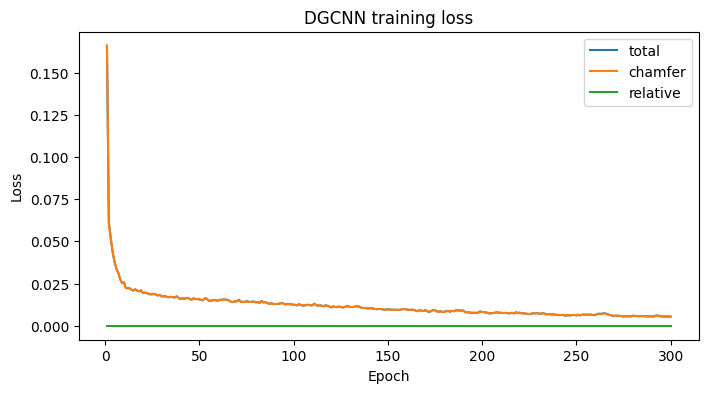

In [122]:
from dgcnn import DGCNNPointCloudAutoEncoder
import matplotlib.pyplot as plt
import torch

used_dataset = dataset
points = used_dataset["points_norm"]
size = [i['size'] for i in used_dataset['metadata']]
depth = [i['depth'] if 'depth' in i.keys() else None for i in used_dataset['metadata']]
device = "cuda" if torch.cuda.is_available() else "cpu"

dgcnn_model = DGCNNPointCloudAutoEncoder(
    latent_dim=128,
    num_points=points.shape[1],
    k=20,
    emb_dims=512,
    encoder_dropout=0.1,
).to(device)

# DGCNN is heavier than PointNet because it rebuilds local kNN graphs.
# If you hit OOM, reduce batch_size from 4 to 2.
dgcnn_history = dgcnn_model.train_model(
    points,
    epochs=300,
    batch_size=16,
    lr=1e-3,
    device=device,
    chamfer_weight=1.0,
    relative_weight=0.0,
    relative_mode="knn",
    knn_k=16,
)

plt.figure(figsize=(8, 4))
plt.plot(dgcnn_history["epoch"], dgcnn_history["loss"], label="total")
plt.plot(dgcnn_history["epoch"], dgcnn_history["chamfer"], label="chamfer")
plt.plot(dgcnn_history["epoch"], dgcnn_history["relative"], label="relative")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("DGCNN training loss")
plt.legend()
plt.show()


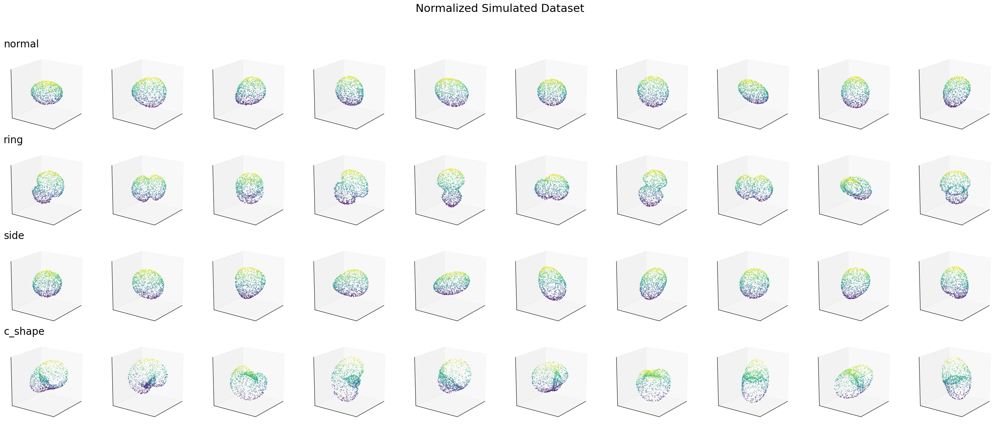

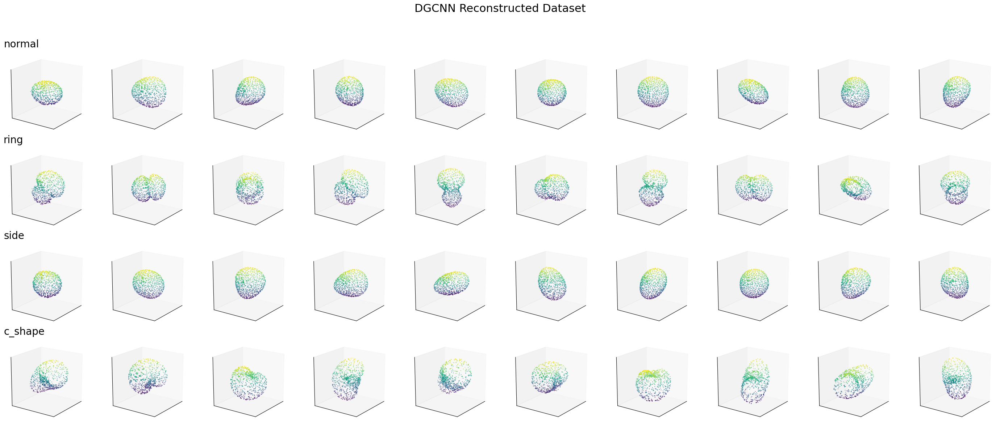

In [125]:
plot_simulated_dataset_gallery(
    used_dataset,
    samples_per_subtype=10,
    figsize=(28,12),
    point_size=2.0,
    title="Normalized Simulated Dataset",
    points_key='points_norm'
)
plot_reconstructed_dataset_gallery(
    dgcnn_model,
    used_dataset,
    device=device,
    samples_per_subtype=10,
    figsize=(28,12),
    point_size=2.0,
    random_state=0,
    title="DGCNN Reconstructed Dataset",
    points_key='points_norm'
)


In [132]:
import os
import gc
import numpy as np
import torch
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

os.environ.setdefault("NUMBA_CACHE_DIR", "/tmp/numba_cache")
import umap.umap_ as umap


def encode_dgcnn_in_batches(model, points_array, device="cuda", batch_size=8):
    model.eval()
    latents = []

    with torch.no_grad():
        for start in range(0, len(points_array), batch_size):
            end = min(start + batch_size, len(points_array))

            batch = points_array[start:end]
            if not torch.is_tensor(batch):
                batch = torch.tensor(batch, dtype=torch.float32)

            batch = batch.to(device, non_blocking=True)

            z = model.encode(batch, device=device)

            if torch.is_tensor(z):
                z = z.detach().cpu().numpy()

            latents.append(z)

            del batch, z
            torch.cuda.empty_cache()

    gc.collect()
    torch.cuda.empty_cache()

    return np.concatenate(latents, axis=0)


sample_idx = 1
sample_points = points[sample_idx]

dgcnn_model.eval()
with torch.no_grad():
    recon, z = dgcnn_model.reconstruct(sample_points, device=device)

if torch.is_tensor(recon):
    recon = recon.detach().cpu().numpy()

if torch.is_tensor(z):
    z = z.detach().cpu().numpy()

gc.collect()
torch.cuda.empty_cache()

print("Sample input shape:", sample_points.shape)
print("Sample reconstruction shape:", recon.shape)
print("Latent shape:", z.shape)

plot_point_cloud(sample_points, title=f"DGCNN hard input sample {sample_idx}")
plot_point_cloud(recon, title=f"DGCNN hard reconstruction sample {sample_idx}")

dgcnn_points = used_dataset["points_norm"]

dgcnn_latents = encode_dgcnn_in_batches(
    dgcnn_model,
    dgcnn_points,
    device=device,
    batch_size=4,
)

labels_raw = np.asarray(used_dataset["labels"])
subtypes = np.asarray(used_dataset["subtypes"]).astype(str)

if len(dgcnn_latents) != len(labels_raw) or len(dgcnn_latents) != len(subtypes):
    raise ValueError(
        "DGCNN latents, labels, and subtypes must have the same length for plotting."
    )

dgcnn_reducer = umap.UMAP(
    n_components=2,
    n_neighbors=min(15, len(dgcnn_latents) - 1),
    min_dist=0.1,
    metric="euclidean",
    random_state=42,
)

dgcnn_embedding = dgcnn_reducer.fit_transform(dgcnn_latents)

print("DGCNN hard latents shape:", dgcnn_latents.shape)
print("DGCNN hard UMAP embedding shape:", dgcnn_embedding.shape)

palette = [
    "#4C78A8", "#E45756", "#F58518", "#54A24B",
    "#B279A2", "#72B7B2", "#FF9DA6", "#9D755D",
]

subtype_names = list(dict.fromkeys(subtypes))
subtype_base_colors = {
    "normal": "#4C78A8",
    "ring": "#F58518",
    "side": "#54A24B",
    "c_shape": "#B279A2",
}

subtype_colors = {
    name: subtype_base_colors.get(name, palette[i % len(palette)])
    for i, name in enumerate(subtype_names)
}

size = np.asarray(
    [meta.get("size", np.nan) for meta in used_dataset["metadata"]],
    dtype=float,
)

depth = np.asarray(
    [meta.get("depth", np.nan) for meta in used_dataset["metadata"]],
    dtype=float,
)

depth_size_ratio = depth / (size + 1e-8)

Sample input shape: (1024, 3)
Sample reconstruction shape: (1024, 3)
Latent shape: (128,)


/insomnia001/depts/pmg/users/hy2897/conda_envs/LUNA/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


DGCNN hard latents shape: (800, 128)
DGCNN hard UMAP embedding shape: (800, 2)


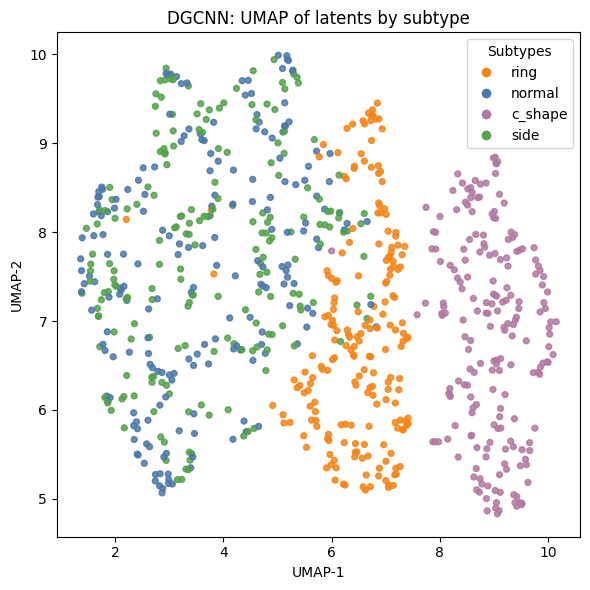

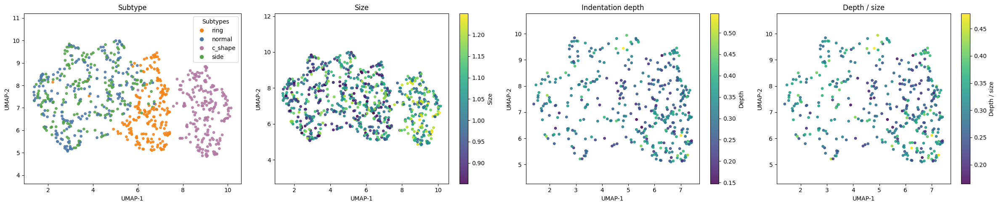

In [133]:

fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.scatter(
    dgcnn_embedding[:, 0],
    dgcnn_embedding[:, 1],
    c=[subtype_colors[v] for v in subtypes],
    s=18,
    alpha=0.85,
)
ax.set_title("DGCNN: UMAP of latents by subtype")
ax.set_xlabel("UMAP-1")
ax.set_ylabel("UMAP-2")
ax.legend(
    handles=[
        Line2D([0], [0], marker="o", color="w",
               markerfacecolor=subtype_colors[name], markersize=8, label=name)
        for name in subtype_names
    ],
    title="Subtypes",
)
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(1, 4, figsize=(24, 5))

ax[0].scatter(
    dgcnn_embedding[:, 0],
    dgcnn_embedding[:, 1],
    c=[subtype_colors[v] for v in subtypes],
    s=15,
    alpha=0.85,
)
ax[0].set_title("Subtype")
ax[0].legend(
    handles=[
        Line2D([0], [0], marker="o", color="w",
               markerfacecolor=subtype_colors[name], markersize=8, label=name)
        for name in subtype_names
    ],
    title="Subtypes",
)

sc = ax[1].scatter(
    dgcnn_embedding[:, 0],
    dgcnn_embedding[:, 1],
    c=size,
    s=15,
    alpha=0.85,
    cmap="viridis",
)
ax[1].set_title("Size")
fig.colorbar(sc, ax=ax[1], label="Size")

sc = ax[2].scatter(
    dgcnn_embedding[:, 0],
    dgcnn_embedding[:, 1],
    c=depth,
    s=15,
    alpha=0.85,
    cmap="viridis",
)
ax[2].set_title("Indentation depth")
fig.colorbar(sc, ax=ax[2], label="Depth")

sc = ax[3].scatter(
    dgcnn_embedding[:, 0],
    dgcnn_embedding[:, 1],
    c=depth_size_ratio,
    s=15,
    alpha=0.85,
    cmap="viridis",
)
ax[3].set_title("Depth / size")
fig.colorbar(sc, ax=ax[3], label="Depth / size")

for axis in ax:
    axis.set_xlabel("UMAP-1")
    axis.set_ylabel("UMAP-2")
    axis.set_aspect("equal", adjustable="datalim")

plt.tight_layout()
plt.show()


# Applied on real data

In [145]:
import os
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
import plotly
import plotly.graph_objects as go
import open3d as o3d

os.environ.setdefault("NUMBA_CACHE_DIR", "/tmp/numba_cache")
import umap.umap_ as umap


In [153]:

data_dir = Path("/insomnia001/home/hy2897/data/mcc/ST28_emb1_1_2026_03_30__09_37_06/")
#data_dir = Path("/insomnia001/home/hy2897/data/mcc/ST28_emb2_2_2026_03_30__09_54_17")
ply_files = sorted(
    data_dir.glob("*.ply"),
    key=lambda path: int(path.stem) if path.stem.isdigit() else path.stem,
)

all_points = []
real_nucleus_ids = []
for ply_file in ply_files:
    pcd = o3d.io.read_point_cloud(str(ply_file))
    points = np.asarray(pcd.points, dtype=np.float32)
    if points.size == 0:
        continue
    all_points.append(points[:, :3])
    real_nucleus_ids.append(ply_file.stem)

if len(all_points) == 0:
    raise ValueError(f"No non-empty .ply point clouds found in {data_dir}")

point_counts = np.asarray([len(points) for points in all_points])
print(f"Loaded {len(all_points)} real nuclei from {data_dir}")
print(
    "Raw point counts:",
    f"min={point_counts.min()}, median={int(np.median(point_counts))}, max={point_counts.max()}",
)


Loaded 34 real nuclei from /insomnia001/home/hy2897/data/mcc/ST28_emb1_1_2026_03_30__09_37_06
Raw point counts: min=1024, median=1024, max=1024


### Prepare real nuclei


In [154]:
def resample_point_clouds(point_clouds, n_points, random_state=0):
    rng = np.random.default_rng(random_state)
    sampled = []
    for points in point_clouds:
        points = np.asarray(points, dtype=np.float32)
        if points.ndim != 2 or points.shape[1] < 3:
            raise ValueError(f"Each point cloud must have shape (N, C>=3), got {points.shape}")
        xyz = points[:, :3]
        replace = len(xyz) < n_points
        idx = rng.choice(len(xyz), size=n_points, replace=replace)
        sampled.append(xyz[idx])
    return np.stack(sampled, axis=0)

#pointnet_num_points = int(model.num_points)
dgcnn_num_points = int(dgcnn_model.num_points)

real_points = resample_point_clouds(
    all_points,
    n_points=pointnet_num_points,
    random_state=0,
)
real_points_norm, real_centers, real_scales = normalize_point_cloud_size(real_points)
real_size = real_scales.reshape(-1)

real_dataset = {
    "points": real_points,
    "points_norm": real_points_norm,
    "centers": real_centers,
    "scales": real_scales,
    "ids": np.asarray(real_nucleus_ids),
}

print("real_points shape:", real_points.shape)
print("real_points_norm shape:", real_points_norm.shape)
print("real_size range:", float(real_size.min()), float(real_size.max()))


real_points shape: (34, 1024, 3)
real_points_norm shape: (34, 1024, 3)
real_size range: 3.205106496810913 6.338090896606445


In [155]:
def plot_real_latent_umap(latents, nucleus_ids, title, color_values=None, color_label=None):
    latents = np.asarray(latents)
    nucleus_ids = np.asarray(nucleus_ids).astype(str)
    if latents.ndim != 2:
        raise ValueError(f"Expected latents with shape (N, D), got {latents.shape}")
    if len(latents) != len(nucleus_ids):
        raise ValueError("latents and nucleus_ids must have the same length")
    if len(latents) < 3:
        raise ValueError("UMAP needs at least 3 nuclei for this plotting helper")

    reducer = umap.UMAP(
        n_components=2,
        n_neighbors=min(15, len(latents) - 1),
        min_dist=0.1,
        metric="euclidean",
        random_state=42,
    )
    embedding = reducer.fit_transform(latents)

    if color_values is None:
        color_values = np.arange(len(latents))
        color_label = "real nucleus order"

    fig, ax = plt.subplots(1, 1, figsize=(7, 6))
    sc = ax.scatter(
        embedding[:, 0],
        embedding[:, 1],
        c=color_values,
        cmap="viridis",
        s=36,
        alpha=0.9,
        edgecolors="white",
        linewidths=0.4,
    )
    fig.colorbar(sc, ax=ax, label=color_label)
    ax.set_title(title)
    ax.set_xlabel("UMAP-1")
    ax.set_ylabel("UMAP-2")

    if len(nucleus_ids) <= 80:
        for x, y, nucleus_id in zip(embedding[:, 0], embedding[:, 1], nucleus_ids):
            ax.text(x, y, nucleus_id, fontsize=7, alpha=0.75)

    plt.tight_layout()
    plt.show()
    return embedding


def _select_diverse_embedding_indices(embedding, max_items):
    embedding = np.asarray(embedding, dtype=float)
    n_items = len(embedding)
    if max_items is None or n_items <= max_items:
        return np.arange(n_items, dtype=int)

    max_items = max(1, int(max_items))
    selected = [int(np.argmin(embedding[:, 0]))]
    min_dist = np.linalg.norm(embedding - embedding[selected[0]], axis=1)

    while len(selected) < max_items:
        next_idx = int(np.argmax(min_dist))
        selected.append(next_idx)
        next_dist = np.linalg.norm(embedding - embedding[next_idx], axis=1)
        min_dist = np.minimum(min_dist, next_dist)

    return np.asarray(selected, dtype=int)


def _point_cloud_thumbnail_image(points, max_points=500, random_state=0):
    rng = np.random.default_rng(random_state)
    pts = np.asarray(points, dtype=float)
    if pts.ndim != 2 or pts.shape[1] < 3:
        raise ValueError(f"Each point cloud must have shape (N, C>=3), got {pts.shape}")

    pts = pts[:, :3]
    if len(pts) > max_points:
        idx = rng.choice(len(pts), size=max_points, replace=False)
        pts = pts[idx]

    pts = pts - np.mean(pts, axis=0, keepdims=True)
    _, _, vt = np.linalg.svd(pts, full_matrices=False)
    xy = pts @ vt[:2].T
    depth = pts @ vt[2].T if vt.shape[0] > 2 else np.zeros(len(pts))

    scale = np.max(np.ptp(xy, axis=0))
    if not np.isfinite(scale) or scale <= 0:
        scale = 1.0
    xy = xy / scale
    draw_order = np.argsort(depth)
    xy = xy[draw_order]
    depth = depth[draw_order]

    fig, ax = plt.subplots(1, 1, figsize=(0.9, 0.9), dpi=120)
    ax.scatter(xy[:, 0], xy[:, 1], c=depth, cmap="viridis", s=2.4, alpha=0.98, linewidths=0)
    ax.set_xlim(-0.58, 0.58)
    ax.set_ylim(-0.58, 0.58)
    ax.set_aspect("equal")
    ax.axis("off")
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
    fig.canvas.draw()
    image = np.asarray(fig.canvas.buffer_rgba()).copy()
    plt.close(fig)
    return image


def plot_real_latent_umap_with_point_clouds(
    latents,
    point_clouds,
    nucleus_ids,
    title,
    color_values=None,
    color_label=None,
    max_point_clouds=50,
    points_per_thumbnail=500,
    thumbnail_zoom=0.28,
    random_state=42,
):
    latents = np.asarray(latents)
    point_clouds = np.asarray(point_clouds)
    nucleus_ids = np.asarray(nucleus_ids).astype(str)

    if latents.ndim != 2:
        raise ValueError(f"Expected latents with shape (N, D), got {latents.shape}")
    if point_clouds.ndim != 3 or point_clouds.shape[-1] < 3:
        raise ValueError(f"Expected point_clouds with shape (N, P, C>=3), got {point_clouds.shape}")
    if len(latents) != len(point_clouds) or len(latents) != len(nucleus_ids):
        raise ValueError("latents, point_clouds, and nucleus_ids must have the same length")
    if len(latents) < 3:
        raise ValueError("UMAP needs at least 3 nuclei for this plotting helper")

    reducer = umap.UMAP(
        n_components=2,
        n_neighbors=min(15, len(latents) - 1),
        min_dist=0.1,
        metric="euclidean",
        random_state=random_state,
    )
    embedding = reducer.fit_transform(latents)

    if color_values is None:
        color_values = np.arange(len(latents))
        color_label = "real nucleus order"

    fig, ax = plt.subplots(1, 1, figsize=(13, 10))
    sc = ax.scatter(
        embedding[:, 0],
        embedding[:, 1],
        c=color_values,
        cmap="viridis",
        s=24,
        alpha=0.55,
        edgecolors="white",
        linewidths=0.35,
        zorder=1,
    )
    fig.colorbar(sc, ax=ax, label=color_label)

    x_span = np.ptp(embedding[:, 0]) or 1.0
    y_span = np.ptp(embedding[:, 1]) or 1.0
    ax.set_xlim(embedding[:, 0].min() - 0.18 * x_span, embedding[:, 0].max() + 0.18 * x_span)
    ax.set_ylim(embedding[:, 1].min() - 0.18 * y_span, embedding[:, 1].max() + 0.18 * y_span)

    selected_idx = _select_diverse_embedding_indices(embedding, max_point_clouds)
    for idx in selected_idx:
        image = _point_cloud_thumbnail_image(
            point_clouds[idx],
            max_points=points_per_thumbnail,
            random_state=random_state + int(idx),
        )
        imagebox = OffsetImage(image, zoom=thumbnail_zoom)
        ab = AnnotationBbox(
            imagebox,
            (embedding[idx, 0], embedding[idx, 1]),
            frameon=False,
            pad=0.02,
            zorder=3,
        )
        ax.add_artist(ab)
        ax.text(
            embedding[idx, 0],
            embedding[idx, 1] - 0.045 * y_span,
            nucleus_ids[idx],
            ha="center",
            va="top",
            fontsize=6,
            color="black",
            bbox={"boxstyle": "round,pad=0.12", "facecolor": "white", "alpha": 0.75, "edgecolor": "none"},
            zorder=4,
        )

    ax.set_title(title)
    ax.set_xlabel("UMAP-1")
    ax.set_ylabel("UMAP-2")
    ax.set_aspect("equal", adjustable="datalim")
    plt.tight_layout()
    plt.show()
    return embedding


### PointNet on real nuclei


PointNet real latents shape: (34, 256)


/insomnia001/depts/pmg/users/hy2897/conda_envs/LUNA/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


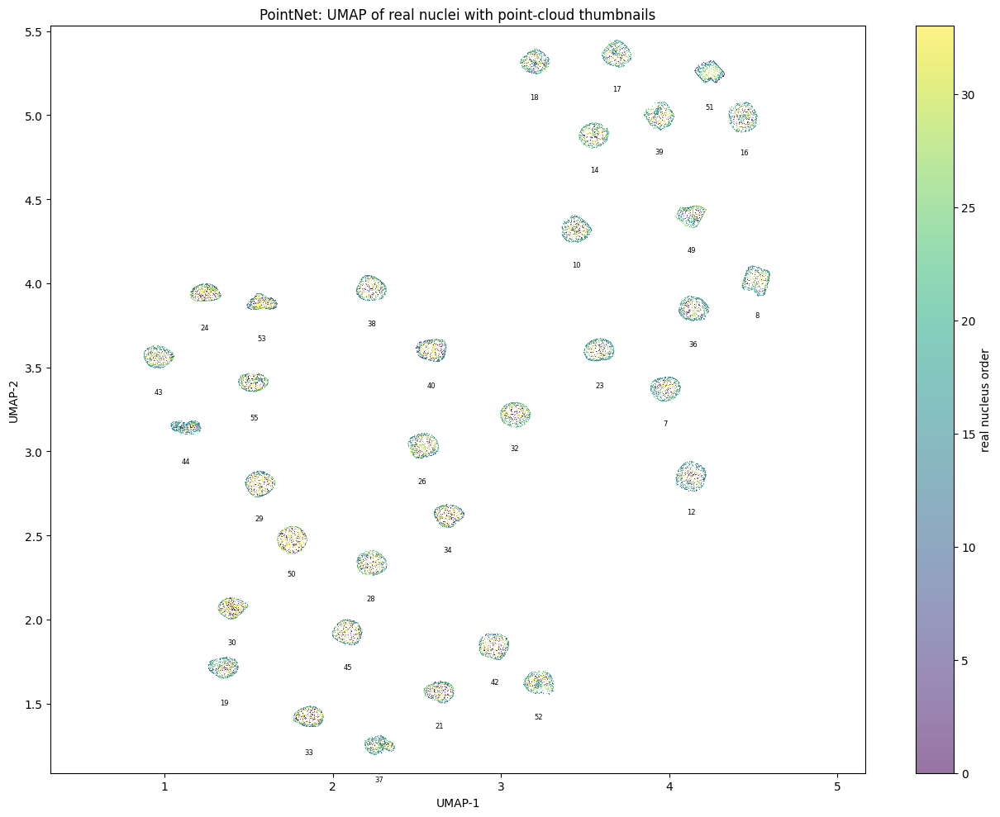

In [168]:
real_pointnet_latents = model.encode(real_dataset["points_norm"], device=device)
print("PointNet real latents shape:", real_pointnet_latents.shape)

real_pointnet_embedding = plot_real_latent_umap_with_point_clouds(
    real_pointnet_latents,
    real_dataset["points_norm"],
    real_dataset["ids"],
    title="PointNet: UMAP of real nuclei with point-cloud thumbnails",
    color_values=None,
    color_label=None,
    max_point_clouds=50,
    points_per_thumbnail=500,
    thumbnail_zoom=0.28,
)



#### PointNet trained directly on real nuclei


Epoch 001/300 | loss=0.942572 | chamfer=0.942572 | relative=0.000000
Epoch 002/300 | loss=0.422431 | chamfer=0.422431 | relative=0.000000
Epoch 003/300 | loss=0.172801 | chamfer=0.172801 | relative=0.000000
Epoch 004/300 | loss=0.131095 | chamfer=0.131095 | relative=0.000000
Epoch 005/300 | loss=0.106447 | chamfer=0.106447 | relative=0.000000
Epoch 006/300 | loss=0.085878 | chamfer=0.085878 | relative=0.000000
Epoch 007/300 | loss=0.078131 | chamfer=0.078131 | relative=0.000000
Epoch 008/300 | loss=0.068214 | chamfer=0.068214 | relative=0.000000
Epoch 009/300 | loss=0.068540 | chamfer=0.068540 | relative=0.000000
Epoch 010/300 | loss=0.058457 | chamfer=0.058457 | relative=0.000000
Epoch 011/300 | loss=0.065976 | chamfer=0.065976 | relative=0.000000
Epoch 012/300 | loss=0.063522 | chamfer=0.063522 | relative=0.000000
Epoch 013/300 | loss=0.058343 | chamfer=0.058343 | relative=0.000000
Epoch 014/300 | loss=0.053796 | chamfer=0.053796 | relative=0.000000
Epoch 015/300 | loss=0.061192 | ch

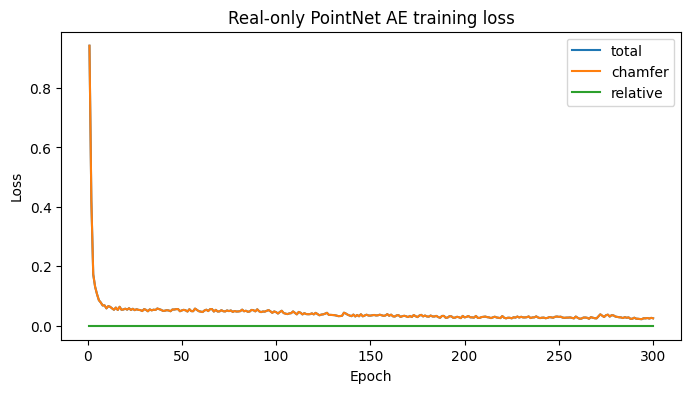

Real-only PointNet latents shape: (34, 256)


/insomnia001/depts/pmg/users/hy2897/conda_envs/LUNA/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


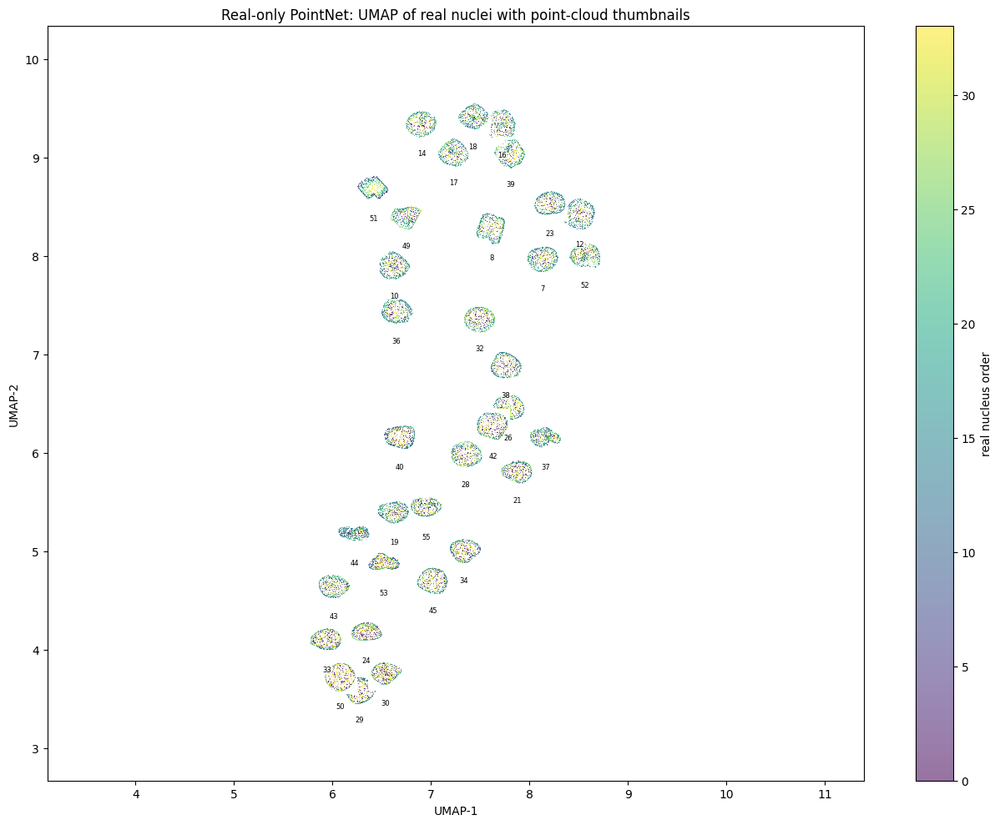

In [171]:
from autoencoder import PointCloudAutoEncoder
import torch

real_pointnet_train_points = real_dataset["points_norm"]
device = "cuda" if torch.cuda.is_available() else "cpu"

real_pointnet_model = PointCloudAutoEncoder(
    latent_dim=256,
    num_points=real_pointnet_train_points.shape[1],
).to(device)

real_pointnet_history = real_pointnet_model.train_model(
    real_pointnet_train_points,
    epochs=300,
    batch_size=min(16, len(real_pointnet_train_points)),
    lr=1e-3,
    device=device,
    chamfer_weight=1.0,
    relative_weight=0.0,
    global_num_pairs="all",
    relative_p=2,
    relative_mode="global",
    knn_k=16,
)

plt.figure(figsize=(8, 4))
plt.plot(real_pointnet_history["epoch"], real_pointnet_history["loss"], label="total")
plt.plot(real_pointnet_history["epoch"], real_pointnet_history["chamfer"], label="chamfer")
plt.plot(real_pointnet_history["epoch"], real_pointnet_history["relative"], label="relative")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Real-only PointNet AE training loss")
plt.legend()
plt.show()

real_pointnet_model_latents = real_pointnet_model.encode(real_pointnet_train_points, device=device)
print("Real-only PointNet latents shape:", real_pointnet_model_latents.shape)

real_pointnet_model_embedding = plot_real_latent_umap_with_point_clouds(
    real_pointnet_model_latents,
    real_dataset["points_norm"],
    real_dataset["ids"],
    title="Real-only PointNet: UMAP of real nuclei with point-cloud thumbnails",
    color_values=None,
    color_label=None,
    max_point_clouds=50,
    points_per_thumbnail=500,
    thumbnail_zoom=0.28,
)


### DGCNN on real nuclei


DGCNN real latents shape: (34, 128)


/insomnia001/depts/pmg/users/hy2897/conda_envs/LUNA/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


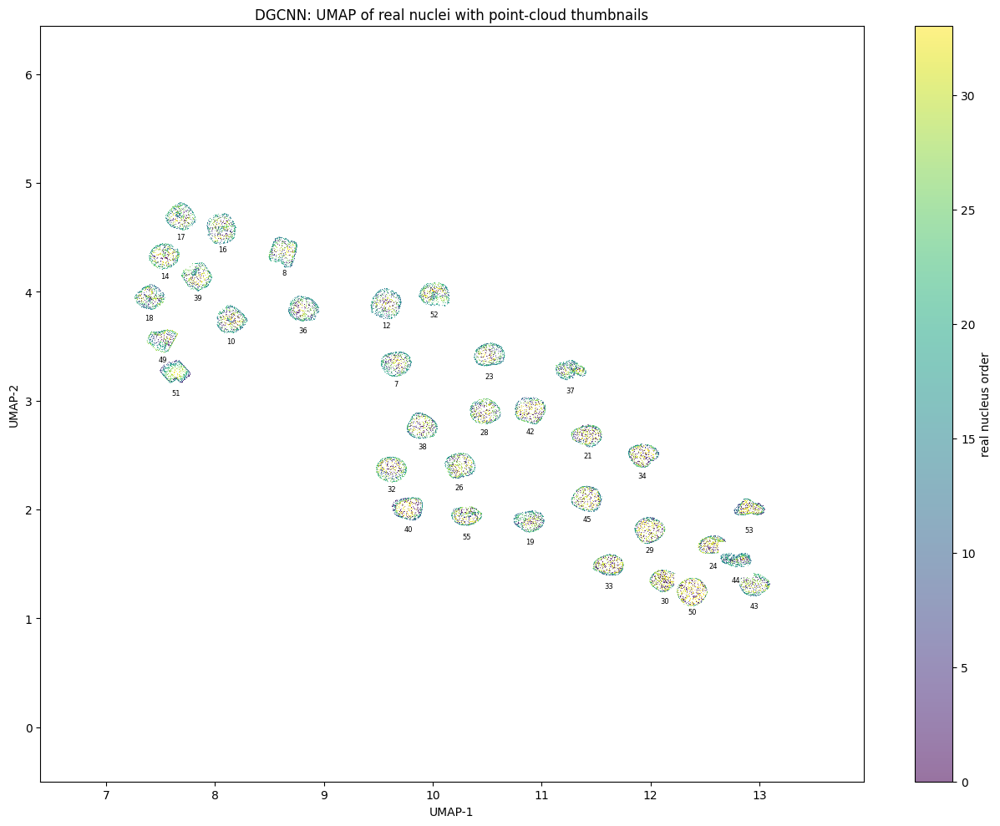

In [169]:
real_dgcnn_latents = dgcnn_model.encode(real_dataset["points_norm"], device=device)
print("DGCNN real latents shape:", real_dgcnn_latents.shape)

real_dgcnn_embedding = plot_real_latent_umap_with_point_clouds(
    real_dgcnn_latents,
    real_dataset["points_norm"],
    real_dataset["ids"],
    title="DGCNN: UMAP of real nuclei with point-cloud thumbnails",
    color_values=None,
    color_label=None,
    max_point_clouds=50,
    points_per_thumbnail=500,
    thumbnail_zoom=0.28,
)



#### DGCNN trained directly on real nuclei


Epoch 001/300 | loss=0.781209 | chamfer=0.781209 | relative=0.000000
Epoch 002/300 | loss=0.257833 | chamfer=0.257833 | relative=0.000000
Epoch 003/300 | loss=0.124546 | chamfer=0.124546 | relative=0.000000
Epoch 004/300 | loss=0.140867 | chamfer=0.140867 | relative=0.000000
Epoch 005/300 | loss=0.108471 | chamfer=0.108471 | relative=0.000000
Epoch 006/300 | loss=0.092439 | chamfer=0.092439 | relative=0.000000
Epoch 007/300 | loss=0.085706 | chamfer=0.085706 | relative=0.000000
Epoch 008/300 | loss=0.075778 | chamfer=0.075778 | relative=0.000000
Epoch 009/300 | loss=0.067158 | chamfer=0.067158 | relative=0.000000
Epoch 010/300 | loss=0.062352 | chamfer=0.062352 | relative=0.000000
Epoch 011/300 | loss=0.060164 | chamfer=0.060164 | relative=0.000000
Epoch 012/300 | loss=0.060298 | chamfer=0.060298 | relative=0.000000
Epoch 013/300 | loss=0.058086 | chamfer=0.058086 | relative=0.000000
Epoch 014/300 | loss=0.070684 | chamfer=0.070684 | relative=0.000000
Epoch 015/300 | loss=0.068013 | ch

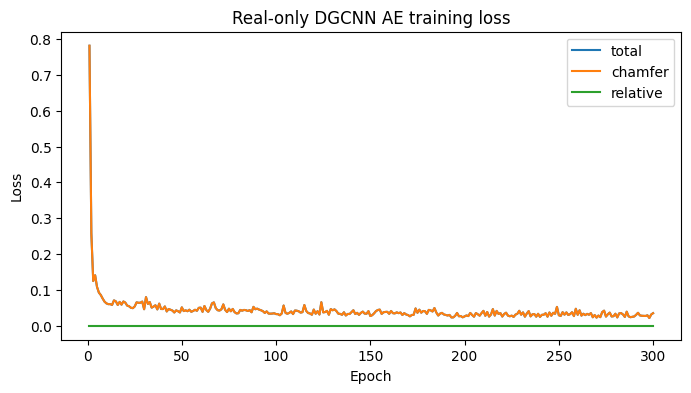

Real-only DGCNN latents shape: (34, 128)


/insomnia001/depts/pmg/users/hy2897/conda_envs/LUNA/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


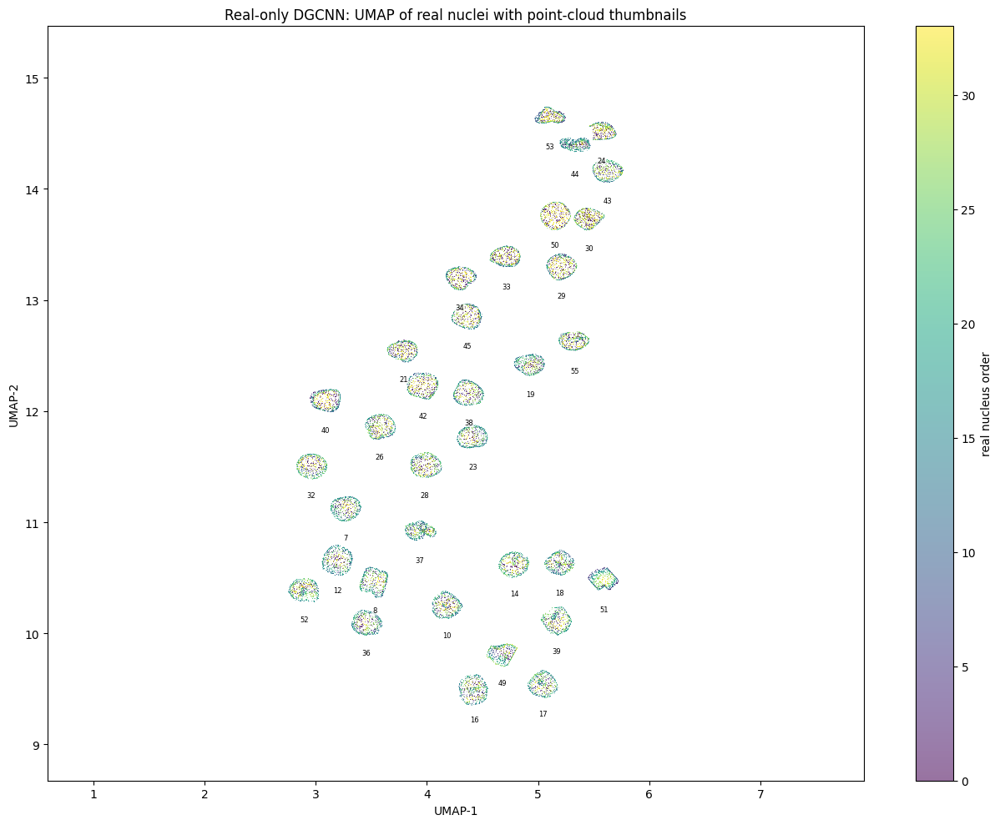

In [170]:
from dgcnn import DGCNNPointCloudAutoEncoder
import torch

real_dgcnn_train_points = real_dataset["points_norm"]
device = "cuda" if torch.cuda.is_available() else "cpu"

real_dgcnn_model = DGCNNPointCloudAutoEncoder(
    latent_dim=128,
    num_points=real_dgcnn_train_points.shape[1],
    k=20,
    emb_dims=512,
    encoder_dropout=0.1,
).to(device)

real_dgcnn_history = real_dgcnn_model.train_model(
    real_dgcnn_train_points,
    epochs=300,
    batch_size=min(16, len(real_dgcnn_train_points)),
    lr=1e-3,
    device=device,
    chamfer_weight=1.0,
    relative_weight=0.0,
    relative_mode="knn",
    knn_k=16,
)

plt.figure(figsize=(8, 4))
plt.plot(real_dgcnn_history["epoch"], real_dgcnn_history["loss"], label="total")
plt.plot(real_dgcnn_history["epoch"], real_dgcnn_history["chamfer"], label="chamfer")
plt.plot(real_dgcnn_history["epoch"], real_dgcnn_history["relative"], label="relative")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Real-only DGCNN AE training loss")
plt.legend()
plt.show()

real_dgcnn_model_latents = real_dgcnn_model.encode(real_dgcnn_train_points, device=device)
print("Real-only DGCNN latents shape:", real_dgcnn_model_latents.shape)

real_dgcnn_model_embedding = plot_real_latent_umap_with_point_clouds(
    real_dgcnn_model_latents,
    real_dataset["points_norm"],
    real_dataset["ids"],
    title="Real-only DGCNN: UMAP of real nuclei with point-cloud thumbnails",
    color_values=None,
    color_label=None,
    max_point_clouds=50,
    points_per_thumbnail=500,
    thumbnail_zoom=0.28,
)
